In [1]:
import os
import numpy as np

import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

!pip install geopy  
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

!pip install matplotlib
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.style.use('ggplot')

!pip install folium
import folium # plotting library
from folium import plugins
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster
from folium.plugins import HeatMap

import branca
import branca.colormap as cm

!pip install geojson
import geojson

import math

# 1. Plots Fahrgastzahlen

## 1.1 Import

In [2]:
# working directory anpassen
print(os.getcwd())
user = '/Users/' + os.getlogin()
os.chdir(user + '/Dropbox/Projekt Scripting/01 data')
print(os.getcwd())

/Users/marcogsponer/Dropbox/Projekt Scripting/02 Code
/Users/marcogsponer/Dropbox/Projekt Scripting/01 Data


In [3]:
# File importieren
df_fahr=pd.read_csv('./df_fahrgastzahlen_geo.csv')
df_fahr.head(3)

,haltestellen_id,linien_id,linienname,plan_fahrt_id,belastung,einsteiger,aussteiger,besetzung,traffic_total,anzahl_messungen,haltestellenlangname,distanz_m,halt_lin_kurz,halt_lin_lang,zonen,vsys,linienname_fahrgastauskunft,koord_wgs84_n,koord_wgs84_e,Quartier
0,4,3,916,102001,0.225800,2.260442,1.916962,10.838398,4.177404,5309,"Zürich, Bahnhof Tiefenbrunnen",606.862245,4-916,"Zürich, Bahnhof Tiefenbrunnen Linie 916",110.0,BP,916,8.560994,47.350416,Tiefenbrunnen
1,5,3,916,102001,0.253773,0.238072,0.225833,12.181104,0.463906,5309,"Zollikon, Bahnübergang",525.469388,5-916,"Zollikon, Bahnübergang Linie 916",140.0,BP,916,8.566101,47.345922,Keine Zone
2,6,3,916,102001,0.236839,0.708526,0.750994,11.368270,1.459520,5309,"Zollikon, Felbenstrasse",397.579082,6-916,"Zollikon, Felbenstrasse Linie 916",140.0,BP,916,8.569630,47.343207,Keine Zone


In [4]:
df_fahr=df_fahr.sort_values('einsteiger', ascending=False)
df_fahr.head(3)

,haltestellen_id,linien_id,linienname,plan_fahrt_id,belastung,einsteiger,aussteiger,besetzung,traffic_total,anzahl_messungen,haltestellenlangname,distanz_m,halt_lin_kurz,halt_lin_lang,zonen,vsys,linienname_fahrgastauskunft,koord_wgs84_n,koord_wgs84_e,Quartier
1436,294,65,330,37556,1.024784,32.597700,22.643680,49.189655,55.241380,59,"Weiningen ZH, Schulhaus",410.000000,294-330,"Weiningen ZH, Schulhaus Linie 330",154.0,BL,330,8.428843,47.418538,Keine Zone
1213,169,42,418,35665,0.359032,31.774332,28.094869,63.548664,59.869201,9011,"Zürich, Bahnhof Stadelhofen",252.500000,169-S18,"Zürich, Bahnhof Stadelhofen Linie S18",110.0,FB,S18,8.548155,47.366281,Bellevue
492,129,28,3,80320,0.353914,18.187855,14.973734,31.852223,33.161589,14241,"Zürich, Bahnhofplatz/HB",293.429836,129-3,"Zürich, Bahnhofplatz/HB Linie 3",110.0,T,3,8.539299,47.377250,Bahnhofplatz


In [5]:
df_fahr=df_fahr.sort_values('aussteiger', ascending=False)
df_fahr.head(3)

,haltestellen_id,linien_id,linienname,plan_fahrt_id,belastung,einsteiger,aussteiger,besetzung,traffic_total,anzahl_messungen,haltestellenlangname,distanz_m,halt_lin_kurz,halt_lin_lang,zonen,vsys,linienname_fahrgastauskunft,koord_wgs84_n,koord_wgs84_e,Quartier
1213,169,42,418,35665,0.359032,31.774332,28.094869,63.548664,59.869201,9011,"Zürich, Bahnhof Stadelhofen",252.5,169-S18,"Zürich, Bahnhof Stadelhofen Linie S18",110.0,FB,S18,8.548155,47.366281,Bellevue
1630,710,83,753,69317,0.000000,0.000000,26.111110,NaN,26.111110,18,"Dübendorf, Hochbord Süd",0.0,710-E,"Dübendorf, Hochbord Süd Linie E",121.0,BG,E,8.600574,47.399210,Keine Zone
1436,294,65,330,37556,1.024784,32.597700,22.643680,49.189655,55.241380,59,"Weiningen ZH, Schulhaus",410.0,294-330,"Weiningen ZH, Schulhaus Linie 330",154.0,BL,330,8.428843,47.418538,Keine Zone


In [6]:
df_fahr_bewegung=df_fahr.sort_values('traffic_total', ascending=False)
df_fahr_bewegung.head(3)

,haltestellen_id,linien_id,linienname,plan_fahrt_id,belastung,einsteiger,aussteiger,besetzung,traffic_total,anzahl_messungen,haltestellenlangname,distanz_m,halt_lin_kurz,halt_lin_lang,zonen,vsys,linienname_fahrgastauskunft,koord_wgs84_n,koord_wgs84_e,Quartier
1213,169,42,418,35665,0.359032,31.774332,28.094869,63.548664,59.869201,9011,"Zürich, Bahnhof Stadelhofen",252.5,169-S18,"Zürich, Bahnhof Stadelhofen Linie S18",110.0,FB,S18,8.548155,47.366281,Bellevue
1436,294,65,330,37556,1.024784,32.597700,22.643680,49.189655,55.241380,59,"Weiningen ZH, Schulhaus",410.0,294-330,"Weiningen ZH, Schulhaus Linie 330",154.0,BL,330,8.428843,47.418538,Keine Zone
1439,297,65,330,37556,0.833693,11.965515,22.379310,40.017240,34.344825,30,"Geroldswil, Zentrum",502.0,297-330,"Geroldswil, Zentrum Linie 330",154.0,BL,330,8.409441,47.421455,Keine Zone


In [7]:
df_fahr_bewegung_min=df_fahr.sort_values('traffic_total', ascending=True)
df_fahr_bewegung.head(3)

,haltestellen_id,linien_id,linienname,plan_fahrt_id,belastung,einsteiger,aussteiger,besetzung,traffic_total,anzahl_messungen,haltestellenlangname,distanz_m,halt_lin_kurz,halt_lin_lang,zonen,vsys,linienname_fahrgastauskunft,koord_wgs84_n,koord_wgs84_e,Quartier
1213,169,42,418,35665,0.359032,31.774332,28.094869,63.548664,59.869201,9011,"Zürich, Bahnhof Stadelhofen",252.5,169-S18,"Zürich, Bahnhof Stadelhofen Linie S18",110.0,FB,S18,8.548155,47.366281,Bellevue
1436,294,65,330,37556,1.024784,32.597700,22.643680,49.189655,55.241380,59,"Weiningen ZH, Schulhaus",410.0,294-330,"Weiningen ZH, Schulhaus Linie 330",154.0,BL,330,8.428843,47.418538,Keine Zone
1439,297,65,330,37556,0.833693,11.965515,22.379310,40.017240,34.344825,30,"Geroldswil, Zentrum",502.0,297-330,"Geroldswil, Zentrum Linie 330",154.0,BL,330,8.409441,47.421455,Keine Zone


##  1.2 Plots - Linienbelastung und Haltestellen Traffic

In [8]:
#Endstationen rausfiltern
df_fahr_mind=df_fahr[df_fahr.einsteiger > 0]

In [9]:
#Anfangsstationen rausfiltern
df_fahr_mind_aus=df_fahr[df_fahr.aussteiger > 0]

In [10]:
#Linienname as int
df_fahr['linienname'] = df_fahr['linienname'].astype(int)

### Linienbelastung

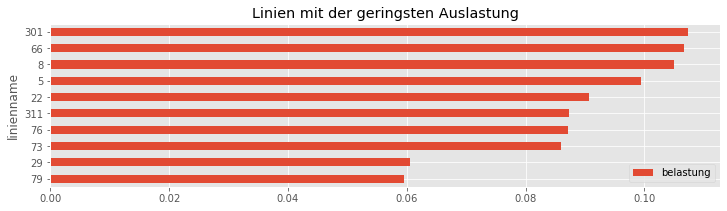

In [11]:
#Linien mit der geringsten Besetzung
(df_fahr.groupby('linienname').mean().reset_index().sort_values('belastung')
 .head(10).plot(kind='barh', figsize=(12,3), x='linienname', y='belastung'))

plt.title('Linien mit der geringsten Auslastung') 
plt.show()

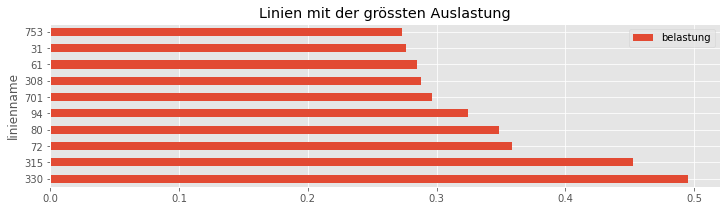

In [12]:
#Linien mit der grössten Besetzung
(df_fahr.groupby('linienname').mean().reset_index().sort_values('belastung', ascending=False)
 .head(10).plot(kind='barh', figsize=(12,3), x=('linienname'), y='belastung'))

plt.title('Linien mit der grössten Auslastung')
plt.show()

## Haltestellen

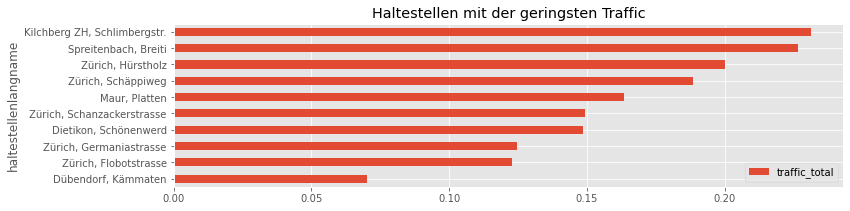

In [13]:
(df_fahr.groupby('haltestellenlangname').mean().reset_index().sort_values('traffic_total')
.head(10).plot(kind='barh', figsize=(12,3), x='haltestellenlangname', y='traffic_total'))

plt.title('Haltestellen mit der geringsten Traffic') 
plt.show()

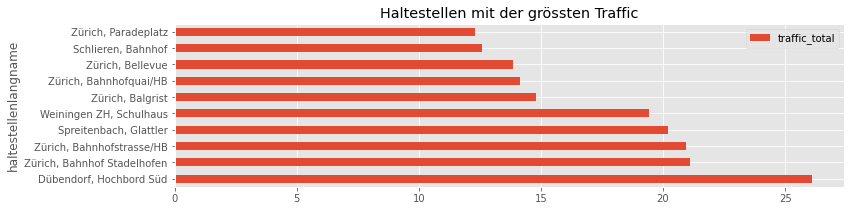

In [14]:
(df_fahr.groupby('haltestellenlangname').mean().reset_index().sort_values('traffic_total', ascending=False)
 .head(10).plot(kind='barh', figsize=(12,3), x='haltestellenlangname', y='traffic_total'))

plt.title('Haltestellen mit der grössten Traffic') 
plt.show()

## Top 10 Haltestelle Traffic

In [15]:
# Zürich lon, lat
latitude = 47.36667
longitude = 8.55

df_fahr_topeinsteiger = df_fahr.groupby('haltestellenlangname').mean().reset_index().sort_values('traffic_total', ascending=False).head(10)
max_colormap = df_fahr_topeinsteiger['traffic_total'].max()

#Farben
colormap = cm.LinearColormap(colors=['lightblue','blue'], index=[0, max_colormap],vmin=0,vmax=max_colormap)

def create_circleMarkerMap(df_fahr_topeinsteiger, latitude, longitude):
    map = folium.Map(location=[latitude, longitude], zoom_start=12)
    for loc, colo in zip(zip(df_fahr_topeinsteiger['koord_wgs84_e'], df_fahr_topeinsteiger['koord_wgs84_n']), df_fahr_topeinsteiger['traffic_total']):
            folium.CircleMarker(
                    location=loc,
                    radius=10,
                    color='black',
                    fill=True,
                    fill_opacity=0.8,
                    fill_color=colormap(colo),
                    parse_html = False).add_to(map)  
    map.add_child(colormap)      
    return map

In [16]:
create_circleMarkerMap(df_fahr_topeinsteiger, latitude, longitude)

# 2. Maps Fahrgastzahlen

## 2.1 Total traffic

In [17]:
# Zürich lon, lat
latitude = 47.36667
longitude = 8.55

#exclude NaN and groupby
df_fahr_ttg = df_fahr.groupby(["haltestellen_id"], as_index=False)["traffic_total"].sum()

#Daten mergen
df_fahr_tt=df_fahr_ttg.merge(df_fahr,left_on='haltestellen_id',right_on='haltestellen_id', how='right')

#Farben
max_bewegung = df_fahr_tt['traffic_total_x'].max()
colormap = cm.LinearColormap(colors=['lightblue','blue'], index=[0, max_bewegung],vmin=0,vmax=max_bewegung)

In [18]:
df_fahr_tt.head(50)

,haltestellen_id,traffic_total_x,linien_id,linienname,plan_fahrt_id,belastung,einsteiger,aussteiger,besetzung,traffic_total_y,anzahl_messungen,haltestellenlangname,distanz_m,halt_lin_kurz,halt_lin_lang,zonen,vsys,linienname_fahrgastauskunft,koord_wgs84_n,koord_wgs84_e,Quartier
0,169,105.567142,42,418,35665,0.359032,31.774332,28.094869,63.548664,59.869201,9011,"Zürich, Bahnhof Stadelhofen",252.500000,169-S18,"Zürich, Bahnhof Stadelhofen Linie S18",110.0,FB,S18,8.548155,47.366281,Bellevue
1,710,26.111110,83,753,69317,0.000000,0.000000,26.111110,NaN,26.111110,18,"Dübendorf, Hochbord Süd",0.000000,710-E,"Dübendorf, Hochbord Süd Linie E",121.0,BG,E,8.600574,47.399210,Keine Zone
2,294,58.246492,65,330,37556,1.024784,32.597700,22.643680,49.189655,55.241380,59,"Weiningen ZH, Schulhaus",410.000000,294-330,"Weiningen ZH, Schulhaus Linie 330",154.0,BL,330,8.428843,47.418538,Keine Zone
3,297,45.633237,65,330,37556,0.833693,11.965515,22.379310,40.017240,34.344825,30,"Geroldswil, Zentrum",502.000000,297-330,"Geroldswil, Zentrum Linie 330",154.0,BL,330,8.409441,47.421455,Keine Zone
4,278,37.747091,65,330,32585,0.391164,1.879310,17.672415,12.517240,19.551725,58,"Schlieren, Bahnhof",95.000000,278-330,"Schlieren, Bahnhof Linie 330",154.0,BL,330,8.448545,47.399433,Keine Zone
5,164,104.793742,13,7,5224,0.300123,16.279521,16.985543,30.312374,33.265064,8639,"Zürich, Bahnhofstrasse/HB",372.269006,164-7,"Zürich, Bahnhofstrasse/HB Linie 7",110.0,T,7,8.539449,47.376223,Schipfe
6,129,98.317778,28,3,80320,0.353914,18.187855,14.973734,31.852223,33.161589,14241,"Zürich, Bahnhofplatz/HB",293.429836,129-3,"Zürich, Bahnhofplatz/HB Linie 3",110.0,T,3,8.539299,47.377250,Bahnhofplatz
7,156,101.827064,23,61,31122,0.438788,13.693999,13.537677,21.061828,27.231676,12795,"Zürich, Bahnhof Oerlikon",409.684015,156-61,"Zürich, Bahnhof Oerlikon Linie 61",110.0,B,61,8.544869,47.411468,Marktplatz Oerlikon
8,156,101.827064,24,62,28879,0.414195,12.715292,12.489230,19.881372,25.204522,13178,"Zürich, Bahnhof Oerlikon",410.464481,156-62,"Zürich, Bahnhof Oerlikon Linie 62",110.0,B,62,8.544869,47.411468,Marktplatz Oerlikon
9,23,124.765921,10,9,83194,0.280210,12.226286,11.869437,23.257402,24.095723,15683,"Zürich, Bellevue",376.106548,23-9,"Zürich, Bellevue Linie 9",110.0,T,9,8.545087,47.367093,Bellevue


In [19]:
def create_circleMarkerMap(df_fahr_tt, latitude, longitude):
    map = folium.Map(location=[latitude, longitude], zoom_start=12)
    for loc, colo in zip(zip(df_fahr_tt['koord_wgs84_e'], df_fahr_tt['koord_wgs84_n']), df_fahr_tt['traffic_total_x']):
            folium.CircleMarker(
                    location=loc,
                    radius=10,
                    color='black',
                    fill=True,
                    fill_opacity=0.8,
                    fill_color=colormap(colo),
                    parse_html = False).add_to(map)  
    map.add_child(colormap)      
    return map

In [20]:
create_circleMarkerMap(df_fahr_tt, latitude, longitude)

## 2.2 Auslastung pro Haltestelle

In [21]:
#exclude NaN and groupby
df_fahr_b=df_fahr.dropna(subset=['belastung'])
df_fahr_ttb = df_fahr_b.groupby(["haltestellen_id"], as_index=False)["belastung"].sum()

#Daten mergen
df_fahr_bb=df_fahr_ttb.merge(df_fahr,left_on='haltestellen_id',right_on='haltestellen_id', how='right')
df_fahr_bb=df_fahr_bb.dropna(subset=['belastung_x'])

#Farben
max_belastung = df_fahr_bb['belastung_x'].max()
colormap = cm.LinearColormap(colors=['lightblue','blue'], index=[0, max_belastung],vmin=0,vmax=max_belastung)

In [22]:
#export df_fahr_bb für detailierte Analyse
df_fahr_bb.to_csv('./df_fahr_bb.csv', index=False)

In [23]:
def create_circleMarkerMap(df_fahr_bb, latitude, longitude):
    map = folium.Map(location=[latitude, longitude], zoom_start=12)
    for loc, colo in zip(zip(df_fahr_bb['koord_wgs84_e'], df_fahr_bb['koord_wgs84_n']), df_fahr_bb['belastung_x']):
            folium.CircleMarker(
                    location=loc,
                    radius=10,
                    color='black',
                    fill=True,
                    fill_opacity=0.8,
                    fill_color=colormap(colo),
                    parse_html = False).add_to(map)  
    map.add_child(colormap)      
    return map

create_circleMarkerMap(df_fahr_bb, latitude, longitude)

## 2.3 Total Traffic pro Quartier

In [24]:
#Keine Zone rausnehmen (Haltestellen ausserhalb Zürich-Stadt)
kz_filt = df_fahr['Quartier']!='Keine Zone'
df_fahr_kz = df_fahr[kz_filt]

In [25]:
map_path = './Geodaten/stzh.adm_statzonen_map.geojson'

In [26]:
def create_kreis_choropleth(df_fahr_kz, map_path, latitude, longitude):
    map = folium.Map(location=[latitude, longitude], zoom_start=12)
    
    folium.Choropleth(
        geo_data=map_path,
        name='traffic_total',
        data=df_fahr_kz,
        columns=['Quartier', 'traffic_total'],
        key_on='feature.properties.stzname',
        fill_color='YlOrRd',
        fill_opacity=0.7,
        legend_name='traffic_total'
    ).add_to(map) 

    folium.LayerControl().add_to(map)

    return map

#traffic_total per Quartier
x = df_fahr_kz[['Quartier','traffic_total']].groupby(['Quartier'])
z = x.sum().reset_index()

create_kreis_choropleth(z, map_path, latitude, longitude)

## 2.4 Auslastung pro Quartier

In [27]:
map_path = './Geodaten/stzh.adm_statzonen_map.geojson'

In [28]:
def create_kreis_choropleth(df_fahr_kz, map_path, latitude, longitude):
    map = folium.Map(location=[latitude, longitude], zoom_start=12)
    
    folium.Choropleth(
        geo_data=map_path,
        name='belastung',
        data=df_fahr_kz,
        columns=['Quartier', 'belastung'],
        key_on='feature.properties.stzname',
        fill_color='YlOrRd',
        fill_opacity=0.7,
        legend_name='belastung'
    ).add_to(map) 

    folium.LayerControl().add_to(map)

    return map

#traffic_total per Quartier
x = df_fahr_kz[['Quartier','belastung']].groupby(['Quartier'])
z = x.sum().reset_index()

create_kreis_choropleth(z, map_path, latitude, longitude)

# 3 Bevölkerung gegen Sitzplatzauslastung pro Haltestelle

In [29]:
# File importieren
df_bev_geo_p=pd.read_csv('./df_bev_geo_p.csv')

#sum of people
df_bev_geo_p['pers_n'].sum()

729400

In [30]:
#Liste für heatmap

heat_data_a = []
heat_data_a = zip(df_bev_geo_p['koord_wgs84_e'], df_bev_geo_p['koord_wgs84_n'], df_bev_geo_p['pers_n'])

final_heat_list = [list(ele) for ele in heat_data_a]

In [39]:
#Create heatmap of Bevölkerung
heatmap = folium.Map(location=[latitude, longitude], zoom_start=12) 

#List of coordinates (Latitude and Longitude)
heat_data = final_heat_list

#Farben
max_belastung = df_fahr_bb['belastung_x'].max()
colormap = cm.LinearColormap(colors=['lightblue','blue'], index=[0, max_belastung],vmin=0,vmax=max_belastung)


# Plot the on the map
HeatMap(heat_data,
        min_opacity=0.5,
        #max_zoom=18,
        radius=40,
        blur=50,
        gradient=False,
        overlay=True).add_to(heatmap)

for loc, colo in zip(zip(df_fahr_bb['koord_wgs84_e'], df_fahr_bb['koord_wgs84_n']), df_fahr_bb['belastung_x']):
        folium.CircleMarker(
                #[lat, lng],
                location=loc,
                radius=10,
                color=colormap(colo),
                fill=True,
                fill_opacity=0.8,
                fill_color=colormap(colo),
                parse_html = False).add_to(heatmap)  

features = {}
for row in pd.unique(df_fahr_bb['linienname']):
    features[row] = folium.FeatureGroup(name=row, show=False)
        
#Punkte der Linien auf Karte plotten        
for index, row in df_fahr_bb.iterrows():
    circ = folium.Circle([row['koord_wgs84_e'], row['koord_wgs84_n']],
                   radius=0,
                   color=colormap(row['belastung_x']),
                   tooltip=(row['haltestellenlangname'],'Durchschn. Belastung:',row['belastung_x']),      
                   weight=20)
    circ.add_to(features[row['linienname']])
        
for row in pd.unique(df_fahr_bb['linienname']):
    features[row].add_to(heatmap)

# Display the map
heatmap